In [1]:
!pip install ray

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from numpy import linalg as LA
from sklearn import metrics
from sklearn.utils import shuffle
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from pmlb import fetch_data
from pmlb import classification_dataset_names, regression_dataset_names
import seaborn as sns

EPS = 1e-6


# Zeroth and first order oracles

In [3]:
#zeroth order oracle
def f(xi,yi,opt_x):
  #logistic regression
  h_val=1.0/(1.0+np.exp(-np.dot(xi,opt_x)))
  if h_val <= EPS:
    h_val = EPS
  elif h_val >= 1-EPS and h_val <= 1:
    h_val = 1-EPS
  return -yi*np.log(h_val)-(1-yi)*np.log(1-h_val)

def grad_f(xi,yi,opt_x):
  #logistic regression
  h_val=1.0/(1.0+np.exp(-np.dot(xi,opt_x)))
  return -(yi-h_val)* xi    

def true_function_val(f,x,y,opt_x):
  f_val=0.0
  for ind in range(0,len(x)):
    f_val=f_val+f(x[ind],y[ind],opt_x)
  f_val=(1.0/len(x))*f_val
  return f_val

def validate(f, x_test,y_test,x_current):
    n = len(x_test)
    predicted_labels = (np.sign(x_test@x_current) + 1)/2
    errors = np.abs(predicted_labels - y_test)
    return 1 - np.mean(errors)
    

######### 1. zeroth and first order oracles with different samples #########
# zeroth order oracle by sampling with specific sampling size
def zeroth_oracle(f,x,y,opt_x,sample_size):
  sample_list=np.random.choice(range(0,len(x)),sample_size,replace=False)
  f_noisy_val=0.0
  for i in range(0,sample_size):
    ind=sample_list[i]
    f_noisy_val=f_noisy_val+f(x[ind],y[ind],opt_x)
  f_noisy_val=(1.0/sample_size)*f_noisy_val
  return f_noisy_val

#first order oracle by sampling with specific sampling size
def first_oracle(f,grad_f,x,y,opt_x,subsample_num):
  grad_list=np.random.choice(range(0,len(x)),subsample_num,replace=False)
  grad_noisy=np.zeros(len(opt_x))
  for ind in grad_list:
    grad_noisy=grad_noisy+grad_f(x[ind],y[ind],opt_x)
  grad_noisy=(1.0/subsample_num)*grad_noisy
  return grad_noisy


######## 2. same batch of samples for zeroth and first order oracle ##########

def zeroth_oracle_epoch(f,x,y,opt_x,sample_size,start_ind):
  sample_list=list(range(start_ind,start_ind+sample_size)) 
  f_noisy_val=0.0
  for i in range(0,sample_size):
    ind=sample_list[i]
    f_noisy_val=f_noisy_val+f(x[ind],y[ind],opt_x)
  f_noisy_val=(1.0/sample_size)*f_noisy_val
  return f_noisy_val

def first_oracle_epoch(f,grad_f,x,y,opt_x,subsample_num,start_ind):
  grad_list=list(range(start_ind,start_ind+sample_size)) 
  grad_noisy=np.zeros(len(opt_x))
  for ind in grad_list:
    grad_noisy=grad_noisy+grad_f(x[ind],y[ind],opt_x)
  grad_noisy=(1.0/subsample_num)*grad_noisy
  return grad_noisy

##################################################################################

def estimate_epi_f(f,x,y,opt_x,zeroth_oracle,sample_size,n_trials,factor=1/5):
  result_arr=np.zeros(n_trials)
  for i in range(n_trials):
    result_arr[i]=zeroth_oracle(f,x,y,opt_x,sample_size)
    
  return np.std(result_arr)*factor


# Algorithms

In [4]:
#line search algorithm
def line_search_same_batch(f,grad_f,x,y,zeroth_oracle,first_oracle,sample_size,x_0,
                      eps_f,alpha_0,alpha_max,dec_gamma,inc_gamma,theta,epoch,
                      num_epochs_per_estimate=1, factor=1/5, epi_f_zeroth_oracle=zeroth_oracle, x_test=None, y_test=None):
  dim=len(x_0)
  total_number=len(x)
  x_current=x_0
  x_previous=np.ones(dim)
  iteration=epoch*(total_number/sample_size)
  iteration=int(iteration)
  fun_val_arr=np.zeros(iteration)
  val_acc_arr = np.zeros(iteration)
  alpha= alpha_0
  iteration_count=0
  start_ind=0
  prev_epoch_number = -1
  while iteration_count<iteration:
    # shuffle at the start of each epoch
    if start_ind == 0:
        x,y = shuffle(x, y, random_state=iteration_count)
        
    epoch_number = int(np.floor(iteration_count * sample_size / total_number))
    if epoch_number == int(prev_epoch_number + 1) and (epoch_number % num_epochs_per_estimate == 0):
      prev_epoch_number += 1
      eps_f = estimate_epi_f(f,x,y,x_current,epi_f_zeroth_oracle,sample_size,n_trials=30,factor=factor)
    grad_approximation=first_oracle(f,grad_f,x,y,x_current,sample_size,start_ind)
    x_new=x_current-alpha*grad_approximation
    f_current=zeroth_oracle(f,x,y,x_current,sample_size,start_ind)
    f_new=zeroth_oracle(f,x,y,x_new,sample_size,start_ind)
    start_ind=(start_ind+sample_size)%total_number
    if f_new<=f_current-alpha*theta*LA.norm(grad_approximation)**2+2*eps_f:
      x_previous=x_current
      x_current=x_new
      alpha=min(inc_gamma*alpha,alpha_max)  
      function_true_new = true_function_val(f,x,y,x_current)
      fun_val_arr[iteration_count]= function_true_new 
      validation_accuracy = validate(f,x_test,y_test,x_current)
      val_acc_arr[iteration_count] = validation_accuracy
    else:
      alpha=dec_gamma*alpha
      function_true_current= true_function_val(f,x,y,x_current)
      fun_val_arr[iteration_count]= function_true_current  
      validation_accuracy = validate(f,x_test,y_test,x_current)
      val_acc_arr[iteration_count] = validation_accuracy
    iteration_count=iteration_count+1

  return x_current,fun_val_arr,val_acc_arr

In [5]:
# the SLS algorithm:
def reset_opt_2(eta,eta_max,gamma,sample_size,iteration_count,total_number):
  if iteration_count == 0:
    return eta_max
  else:
    eta = eta*gamma**(sample_size/total_number)
    return min(eta,10)

def sls(f, grad_f, x, y, zeroth_oracle,first_oracle,x_0, c, beta, gamma, eta_max, sample_size, epoch, x_test, y_test):
    dim = len(x_0)
    total_number = len(x)
    iteration = int(epoch*(total_number/sample_size))
    fun_val_arr = np.zeros(iteration)
    val_acc_arr = np.zeros(iteration)
    
    iteration_count = 0
    x_current=x_0
    x_previous=np.ones(dim)
    eta = eta_max
    iteration_count=0
    start_ind=0
    count_f_eval_extra=0
    
    while iteration_count < iteration:
        # shuffle at the start of each epoch
        if start_ind == 0:
            x,y = shuffle(x, y, random_state=iteration_count)
        
        grad_approximation=first_oracle(f,grad_f,x,y,x_current,sample_size,start_ind)
        f_current=zeroth_oracle(f,x,y,x_current,sample_size,start_ind)
        eta=reset_opt_2(eta,eta_max,gamma,sample_size,iteration_count,total_number)
        x_cand=x_current-eta*grad_approximation
        f_cand=zeroth_oracle(f,x,y,x_cand,sample_size,start_ind)
        if f_cand <= f_current-c*eta*LA.norm(grad_approximation)**2:
          start_ind=(start_ind+sample_size)% total_number
          x_previous=x_current
          x_current=x_cand
          function_true_new = true_function_val(f,x,y,x_current)
          fun_val_arr[iteration_count]= function_true_new 
          validation_accuracy = validate(f,x_test,y_test,x_current)
          val_acc_arr[iteration_count] = validation_accuracy
          iteration_count=iteration_count+1
        else:
          fun_val_arr[iteration_count]= true_function_val(f,x,y,x_current)
          val_acc_arr[iteration_count] = validate(f,x_test,y_test,x_current)
          iteration_count=iteration_count+1
          while iteration_count < iteration and f_cand > f_current-c*eta*LA.norm(grad_approximation)**2:
              eta=beta*eta
              x_cand=x_current-eta*grad_approximation
              f_cand=zeroth_oracle(f,x,y,x_cand,sample_size,start_ind)
              fun_val_arr[iteration_count]= true_function_val(f,x,y,x_current) 
              val_acc_arr[iteration_count] = validate(f,x_test,y_test,x_current)
              count_f_eval_extra=count_f_eval_extra + 1
              iteration_count=iteration_count+1
          if f_cand <= f_current-c*eta*LA.norm(grad_approximation)**2:
            start_ind=(start_ind+sample_size)% total_number
            x_previous=x_current
            x_current=x_cand
            fun_val_arr[iteration_count-1]= true_function_val(f,x,y,x_current)
            val_acc_arr[iteration_count-1] = validate(f,x_test,y_test,x_current)
          
    return x_current,fun_val_arr, count_f_eval_extra, val_acc_arr
    

In [6]:
#line search algorithm with full gradient
def line_search_full_grad(f,grad_f,x,y,first_oracle,x_0,alpha_0,alpha_max,dec_gamma,inc_gamma,theta,epoch,x_test,y_test):
    dim=len(x_0)
    total_number=len(x)
    x_current=x_0
    x_previous=np.ones(dim)
    iteration=epoch
    fun_val_arr=np.zeros(iteration)
    val_acc_arr = np.zeros(iteration)
    alpha= alpha_0
    iteration_count=0
    while iteration_count<iteration:      
        grad_approximation=first_oracle(f,grad_f,x,y,x_current,total_number)
        x_new=x_current-alpha*grad_approximation
        f_current= true_function_val(f,x,y,x_current)
        f_new= true_function_val(f,x,y,x_new)
        if f_new<=f_current-alpha*theta*LA.norm(grad_approximation)**2:
            x_previous=x_current
            x_current=x_new
            alpha=min(inc_gamma*alpha,alpha_max)  
            fun_val_arr[iteration_count]= f_new 
            val_acc_arr[iteration_count] = validate(f,x_test,y_test,x_current)
        else:
            alpha=dec_gamma*alpha
            fun_val_arr[iteration_count]= f_current
            val_acc_arr[iteration_count] = validate(f,x_test,y_test,x_current)
        iteration_count=iteration_count+1
    return x_current,fun_val_arr,val_acc_arr

# Dataset Tools

In [7]:
def rbf_kernel(A, B, sigma):
    distsq = np.square(metrics.pairwise.pairwise_distances(A, B, metric="euclidean"))
    K = np.exp(-1 * distsq/(2*sigma**2))
    return K

def get_dataset(dataset_name, sigma,sample_size):
    data = fetch_data(dataset_name)
    y = data['target']
    X = data.drop('target',axis = 1)
    x = preprocessing.scale(X)
    n = len(x)
    dim=len(x[0])    
    X_train, X_test, Y_train, Y_test = train_test_split(x,y, test_size = 0.2, shuffle=False, random_state=0)
    len_train=len(X_train)

    
    X_train, Y_train = shuffle(X_train, Y_train, random_state=0)
    total_num = np.ceil(len_train/sample_size)*sample_size
    add_num=total_num-len_train
    int_add_num=int(add_num)
    X_add=np.zeros([int_add_num,dim])
    Y_add=np.zeros(int_add_num)
    sampled_list=np.random.choice(range(0,len_train),int_add_num,replace=False)
    for i in range(0,int_add_num):
        ind=sampled_list[i]
        X_add[i]=X_train[ind]
        Y_add[i]=Y_train[ind]
    X_train=np.concatenate((X_train,X_add))
    Y_train=np.concatenate((Y_train,Y_add))
    X_train, Y_train = shuffle(X_train, Y_train, random_state=1)

    k_train_X = rbf_kernel(X_train, X_train, sigma)
    k_test_X = rbf_kernel(X_test, X_train, sigma)
    
    return k_train_X, Y_train, k_test_X ,Y_test
    

In [8]:
#All binary classification problems in PMLB with data points from 150-5000 

dataset_names_new = ['analcatdata_lawsuit',
'australian',
'backache',
'biomed',
'breast_cancer_wisconsin',
'breast_cancer',
'breast_w',
'breast',
'buggyCrx',
'bupa',
'chess',
'churn',
'clean1',
'cleve',
'colic',
'corral',
'credit_a',
'credit_g',
'crx',
'diabetes',
'dis',
'flare',
'GAMETES_Epistasis_2_Way_1000atts_0.4H_EDM_1_EDM_1_1',
'GAMETES_Epistasis_2_Way_20atts_0.1H_EDM_1_1',
'GAMETES_Epistasis_2_Way_20atts_0.4H_EDM_1_1',
'GAMETES_Epistasis_3_Way_20atts_0.2H_EDM_1_1',
'GAMETES_Heterogeneity_20atts_1600_Het_0.4_0.2_50_EDM_2_001',
'GAMETES_Heterogeneity_20atts_1600_Het_0.4_0.2_75_EDM_2_001',
'german',
'glass2',
'haberman',
'heart_c',
'heart_h',
'heart_statlog',
'hepatitis',
'Hill_Valley_with_noise',
'Hill_Valley_without_noise',
'horse_colic',
'house_votes_84',
'hungarian',
'hypothyroid',
'ionosphere',
'irish',
'kr_vs_kp',
'mofn_3_7_10',
'monk1',
'monk2',
'monk3',
'parity5+5',
'pima',
'prnn_crabs',
'prnn_synth',
'profb',
'saheart',
'sonar',
'spambase',
'spect',
'spectf',
'threeOf9',
'tic_tac_toe',
'tokyo1',
'vote',
'wdbc',
'xd6']

# Binary classification experiments

DATASET:  analcatdata_lawsuit
number of 128 samples:  2.0


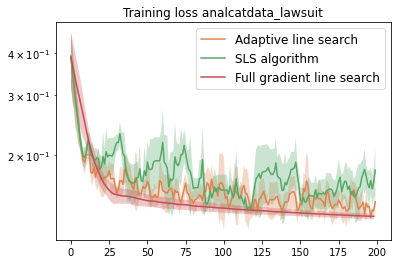

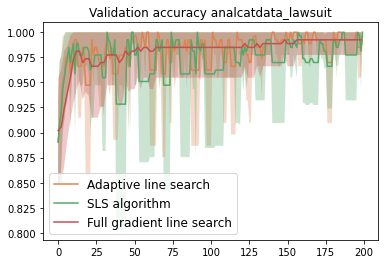

DATASET:  australian
number of 128 samples:  5.0


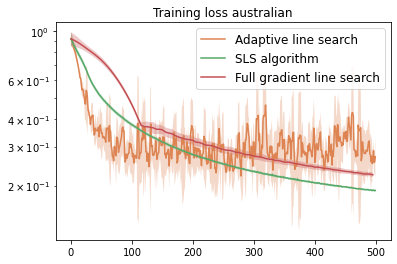

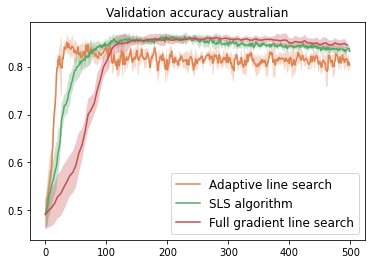

DATASET:  backache
number of 128 samples:  2.0


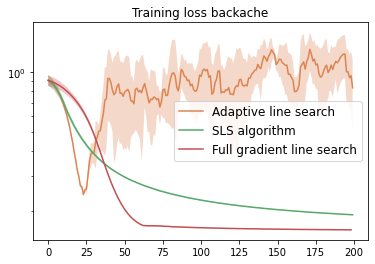

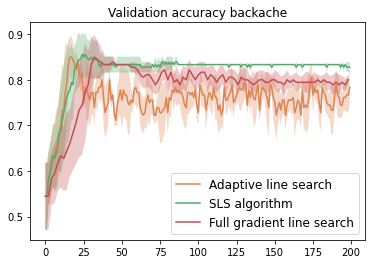

DATASET:  biomed
number of 128 samples:  2.0


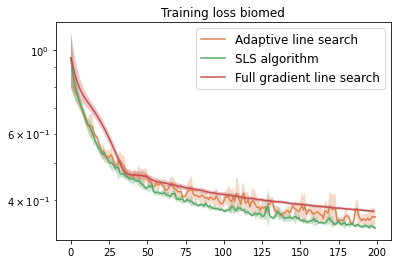

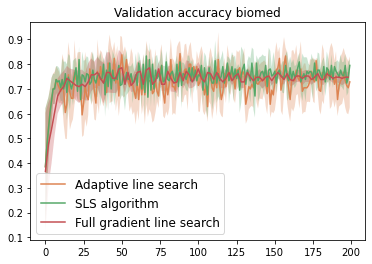

DATASET:  breast_cancer_wisconsin
number of 128 samples:  4.0


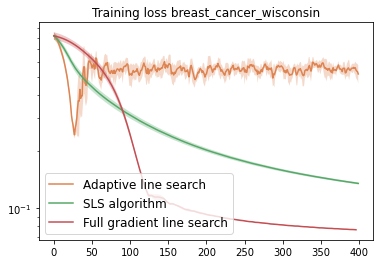

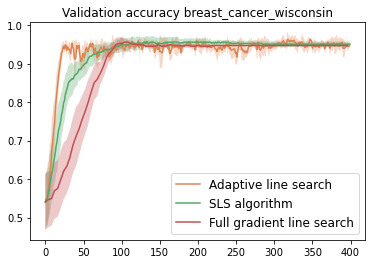

DATASET:  breast_cancer
number of 128 samples:  2.0


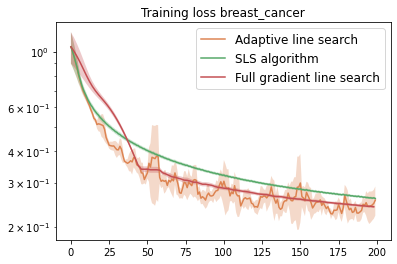

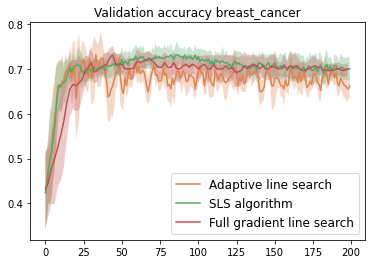

DATASET:  breast_w
number of 128 samples:  5.0


KeyboardInterrupt: 

In [9]:
np.random.seed(1)

#################### Real Datasets: non-separable #######################
sample_size= 128 
data_sets = dataset_names_new
number_datasets=len(data_sets)

perform_our_algo_same_batch= np.zeros(number_datasets)
perform_sls= np.zeros(number_datasets)
perform_full_grad= np.zeros(number_datasets)
dataset_ind=0

for dataset in data_sets:
    sigma_para=1
    X_train,Y_train,X_test,Y_test=get_dataset(dataset, sigma_para, sample_size)

    #run the algorithm with multiple initial points and check performance

    n = len(X_train)
    num_of_batch =n/sample_size
    print("DATASET: ", dataset)
    print("number of 128 samples: ",num_of_batch)
    dim=len(X_train[0])

    trials=5
    epoch=100
    iteration=int(epoch*num_of_batch)
    fun_value_matrix1=np.zeros([trials,iteration])
    fun_value_matrix_2=np.zeros([trials,iteration])
    fun_value_matrix_full=np.zeros([trials,epoch])
    val_acc_matrix1=np.zeros([trials,iteration])
    val_acc_matrix_2=np.zeros([trials,iteration])
    val_acc_matrix_full=np.zeros([trials,epoch])
    count_f_eval_extra_arr=np.zeros(trials)

    for k in range(0,trials):
        #parameters for line search
        X_train,Y_train= shuffle(X_train, Y_train, random_state=k)
        x_0=np.random.normal(0, 1, dim)
        dec_gamma=0.7
        inc_gamma=1.25
        theta=0.2
        alpha_max=np.inf
        alpha_0=1
        n_trials=30
        ### use the standard deviation of noisy function values at x_0 as epi_f ###
        eps_f = estimate_epi_f(f,X_train,Y_train,x_0,zeroth_oracle,sample_size,n_trials) # try different values


        x_output1,fun_value_arr1,val_acc_arr1=line_search_same_batch(f,grad_f,X_train,Y_train,zeroth_oracle_epoch,
                                                      first_oracle_epoch,sample_size,x_0,
                                                      eps_f,alpha_0,alpha_max,dec_gamma,inc_gamma,
                                                      theta,epoch,factor=1/5,epi_f_zeroth_oracle=zeroth_oracle,
                                                      x_test=X_test,y_test=Y_test)
        fun_value_matrix1[k,:] = fun_value_arr1
        val_acc_matrix1[k,:] = val_acc_arr1

        x_output_full,fun_val_arr_full,val_acc_arr_full = line_search_full_grad(f,grad_f,X_train,Y_train,first_oracle,x_0,alpha_0,
                                                             alpha_max,dec_gamma,inc_gamma,theta,epoch,X_test,Y_test)
        fun_value_matrix_full[k,:] = fun_val_arr_full
        val_acc_matrix_full[k,:] = val_acc_arr_full

        c=0.1
        beta=0.9
        gamma=1.5
        eta_max=1
        x_output_2, fun_value_arr_2, count_f_eval_extra, val_acc_arr_2 = sls(f, grad_f,X_train,Y_train,
                                                                           zeroth_oracle_epoch,first_oracle_epoch,x_0,
                                                                           c, beta, gamma, eta_max, sample_size, epoch,
                                                                          X_test, Y_test)  
        fun_value_matrix_2[k,:] = fun_value_arr_2
        val_acc_matrix_2[k,:] = val_acc_arr_2
        count_f_eval_extra_arr[k] = count_f_eval_extra

    fun_value_means1 = fun_value_matrix1.mean(0)
    val_acc_means1 = val_acc_matrix1.mean(0)
    fun_value_means_2 = fun_value_matrix_2.mean(0)
    val_acc_means_2 = val_acc_matrix_2.mean(0)
    fun_value_means_full = fun_value_matrix_full.mean(0)
    val_acc_means_full = val_acc_matrix_full.mean(0)
    
    perform_our_algo_same_batch[dataset_ind] = np.mean(fun_value_matrix1.min(axis=1))
    perform_sls[dataset_ind] = np.mean(fun_value_matrix_2.min(axis=1))
    perform_full_grad[dataset_ind] = np.mean(fun_value_matrix_full.min(axis=1))
    dataset_ind = dataset_ind+1

    fun_value_std1 = np.std(fun_value_matrix1, axis=0)
    val_acc_std1 = np.std(val_acc_matrix1, axis=0)
    fun_value_std_2 = np.std(fun_value_matrix_2, axis=0)
    val_acc_std_2 = np.std(val_acc_matrix_2, axis=0)
    fun_value_std_full = np.std(fun_value_matrix_full, axis=0)
    val_acc_std_full = np.std(val_acc_matrix_full, axis=0)

    # plot the mean with standard deviation:
    iteration_num = list(range(iteration))
    epoch_itr_num = num_of_batch*np.arange(epoch)
    fig, ax = plt.subplots()
    clrs = sns.color_palette("deep", 5)
    ax.plot(iteration_num, fun_value_means1, label="Adaptive line search", c=clrs[1])
    ax.fill_between(iteration_num, fun_value_means1-fun_value_std1, fun_value_means1+fun_value_std1 ,alpha=0.3, facecolor=clrs[1])
    ax.plot(iteration_num, fun_value_means_2, label="SLS algorithm", c=clrs[2])
    ax.fill_between(iteration_num, fun_value_means_2-fun_value_std_2, fun_value_means_2+fun_value_std_2 ,alpha=0.3, facecolor=clrs[2])
    ax.plot(epoch_itr_num, fun_value_means_full, label="Full gradient line search", c=clrs[3])
    ax.fill_between(epoch_itr_num, fun_value_means_full-fun_value_std_full, fun_value_means_full+fun_value_std_full ,alpha=0.3, facecolor=clrs[3])
   
    fontsize=12
    plt.title('Training loss %s'%dataset, fontsize=fontsize)
    ax.legend(fontsize=fontsize)
    ax.set_yscale('log')
    plt.show()
    fig.savefig(dataset+'_full_compare_train.png', dpi=300)
    plt.close()
    
    # Plot validation accuracy
    fig, ax = plt.subplots()
    ax.plot(iteration_num, val_acc_means1, label="sass", c=clrs[1])
    ax.fill_between(iteration_num, np.maximum(val_acc_means1-val_acc_std1,0.0), np.minimum(val_acc_means1+val_acc_std1,1.0) ,alpha=0.3, facecolor=clrs[1])
    ax.plot(iteration_num, val_acc_means_2, label="SLS algorithm", c=clrs[2])
    ax.fill_between(iteration_num, np.maximum(val_acc_means_2-val_acc_std_2,0.0), np.minimum(val_acc_means_2+val_acc_std_2, 1.0) ,alpha=0.3, facecolor=clrs[2])
    ax.plot(epoch_itr_num, val_acc_means_full, label="Full gradient line search", c=clrs[3])
    ax.fill_between(epoch_itr_num, np.maximum(val_acc_means_full-val_acc_std_full,0.0), np.minimum(val_acc_means_full+val_acc_std_full, 1.0) ,alpha=0.3, facecolor=clrs[3])
   
    ax.legend(fontsize=fontsize)
    plt.title('Validation accuracy %s'%dataset, fontsize=fontsize)
    
    plt.show()
    fig.savefig(dataset+'_full_compare_test.png', dpi=300)
    plt.close()



# Parallel Experiments

In [10]:
%%time
import ray
import time

# Start Ray.
ray.shutdown()
ray.init()

sample_size= 128 
data_sets = dataset_names_new
number_datasets=len(data_sets)

perform_our_algo_same_batch= np.zeros(number_datasets)
perform_sls= np.zeros(number_datasets)
perform_full_grad= np.zeros(number_datasets)

trials=5
epoch=100

@ray.remote
def parallel_wrapper(dataset):
    np.random.seed(1)

    #################### Real Datasets: non-separable #######################

    sigma_para=1
    X_train,Y_train,X_test,Y_test=get_dataset(dataset, sigma_para, sample_size)

    #run the algorithm with multiple initial points and check performance

    n = len(X_train)
    num_of_batch =n/sample_size
    print("DATASET: ", dataset)
    dim=len(X_train[0])

    iteration=int(epoch*num_of_batch)
    fun_value_matrix1=np.zeros([trials,iteration])
    fun_value_matrix_2=np.zeros([trials,iteration])
    fun_value_matrix_full=np.zeros([trials,epoch])
    val_acc_matrix1=np.zeros([trials,iteration])
    val_acc_matrix_2=np.zeros([trials,iteration])
    val_acc_matrix_full=np.zeros([trials,epoch])
    count_f_eval_extra_arr=np.zeros(trials)

    for k in range(0,trials):
      #parameters for line search
      X_train,Y_train= shuffle(X_train, Y_train, random_state=k)
      x_0=np.random.normal(0, 1, dim)
      dec_gamma=0.7
      inc_gamma=1.25
      theta=0.2
      alpha_max=np.inf
      alpha_0=1
      n_trials=30
    ### use the standard deviation of noisy function values at x_0 as epi_f ###
      eps_f = estimate_epi_f(f,X_train,Y_train,x_0,zeroth_oracle,sample_size,n_trials) # try different values

      x_output1,fun_value_arr1,val_acc_arr1=line_search_same_batch(f,grad_f,X_train,Y_train,zeroth_oracle_epoch,
                                                      first_oracle_epoch,sample_size,x_0,
                                                      eps_f,alpha_0,alpha_max,dec_gamma,inc_gamma,
                                                      theta,epoch,factor=1/5,epi_f_zeroth_oracle=zeroth_oracle,
                                                      x_test=X_test,y_test=Y_test)
      fun_value_matrix1[k,:] = fun_value_arr1
      val_acc_matrix1[k,:] = val_acc_arr1

      x_output_full,fun_val_arr_full,val_acc_arr_full = line_search_full_grad(f,grad_f,X_train,Y_train,first_oracle,x_0,alpha_0,
                                                             alpha_max,dec_gamma,inc_gamma,theta,epoch,X_test,Y_test)
      fun_value_matrix_full[k,:] = fun_val_arr_full
      val_acc_matrix_full[k,:] = val_acc_arr_full

      c=0.1
      beta=0.9
      gamma=1.5
      eta_max=1
      x_output_2, fun_value_arr_2, count_f_eval_extra, val_acc_arr_2 = sls(f, grad_f,X_train,Y_train,
                                                                           zeroth_oracle_epoch,first_oracle_epoch,x_0,
                                                                           c, beta, gamma, eta_max, sample_size, epoch,
                                                                          X_test, Y_test)  
      fun_value_matrix_2[k,:] = fun_value_arr_2
      val_acc_matrix_2[k,:] = val_acc_arr_2
      count_f_eval_extra_arr[k] = count_f_eval_extra
    return fun_value_matrix1, fun_value_matrix_2, fun_value_matrix_full, val_acc_matrix1, val_acc_matrix_2, val_acc_matrix_full, count_f_eval_extra_arr

result_ids = []

for dataset in data_sets:
    result_ids.append(parallel_wrapper.remote(dataset))


results = ray.get(result_ids)  
ray.shutdown()

2022-07-02 14:47:30,801	INFO services.py:1267 -- View the Ray dashboard at http://127.0.0.1:8265


(pid=9848) DATASET:  biomed
(pid=9847) DATASET:  backache
(pid=9843) DATASET:  breast_cancer
(pid=9846) DATASET:  breast_cancer_wisconsin
(pid=9850) DATASET:  australian
(pid=9849) DATASET:  analcatdata_lawsuit
(pid=9844) DATASET:  breast_w
(pid=9845) DATASET:  breast
(pid=9849) DATASET:  buggyCrx
(pid=9848) DATASET:  bupa
(pid=9847) DATASET:  chess
(pid=9843) DATASET:  churn


(pid=9847) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp


(pid=9846) DATASET:  clean1
(pid=9844) DATASET:  cleve
(pid=9845) DATASET:  colic
(pid=9850) DATASET:  corral
(pid=9848) DATASET:  credit_a
(pid=9850) DATASET:  credit_g
(pid=9846) DATASET:  crx
(pid=9849) DATASET:  diabetes
(pid=9844) DATASET:  dis
(pid=9845) DATASET:  flare


(pid=9846) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp


(pid=9848) DATASET:  GAMETES_Epistasis_2_Way_1000atts_0.4H_EDM_1_EDM_1_1


(pid=9848) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp


(pid=9849) DATASET:  GAMETES_Epistasis_2_Way_20atts_0.1H_EDM_1_1
(pid=9846) DATASET:  GAMETES_Epistasis_2_Way_20atts_0.4H_EDM_1_1


(pid=9849) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=9846) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp


(pid=9850) DATASET:  GAMETES_Epistasis_3_Way_20atts_0.2H_EDM_1_1


(pid=9850) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=9846) <ipython-input-3-7719a92b7659>:13: RuntimeWarning: overflow encountered in exp


(pid=9845) DATASET:  GAMETES_Heterogeneity_20atts_1600_Het_0.4_0.2_50_EDM_2_001


(pid=9845) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp


(pid=9848) DATASET:  GAMETES_Heterogeneity_20atts_1600_Het_0.4_0.2_75_EDM_2_001


(pid=9848) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp


(pid=9849) DATASET:  german
(pid=9846) DATASET:  glass2
(pid=9846) DATASET:  haberman
(pid=9850) DATASET:  heart_c
(pid=9846) DATASET:  heart_h
(pid=9845) DATASET:  heart_statlog
(pid=9850) DATASET:  hepatitis
(pid=9846) DATASET:  Hill_Valley_with_noise


(pid=9847) <ipython-input-3-7719a92b7659>:13: RuntimeWarning: overflow encountered in exp


(pid=9850) DATASET:  Hill_Valley_without_noise
(pid=9845) DATASET:  horse_colic
(pid=9849) DATASET:  house_votes_84
(pid=9845) DATASET:  hungarian
(pid=9849) DATASET:  hypothyroid
(pid=9848) DATASET:  ionosphere
(pid=9845) DATASET:  irish
(pid=9848) DATASET:  kr_vs_kp


(pid=9848) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp


(pid=9846) DATASET:  mofn_3_7_10
(pid=9845) DATASET:  monk1
(pid=9850) DATASET:  monk2
(pid=9847) DATASET:  monk3
(pid=9845) DATASET:  parity5+5
(pid=9850) DATASET:  pima
(pid=9847) DATASET:  prnn_crabs
(pid=9850) DATASET:  prnn_synth


(pid=9848) <ipython-input-3-7719a92b7659>:13: RuntimeWarning: overflow encountered in exp


(pid=9847) DATASET:  profb
(pid=9846) DATASET:  saheart
(pid=9850) DATASET:  sonar
(pid=9845) DATASET:  spambase
(pid=9846) DATASET:  spect
(pid=9850) DATASET:  spectf
(pid=9847) DATASET:  threeOf9
(pid=9846) DATASET:  tic_tac_toe


(pid=9846) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp


(pid=9850) DATASET:  tokyo1
(pid=9847) DATASET:  vote
(pid=9846) DATASET:  wdbc
(pid=9847) DATASET:  xd6
CPU times: user 52.1 s, sys: 14.2 s, total: 1min 6s
Wall time: 36min 53s


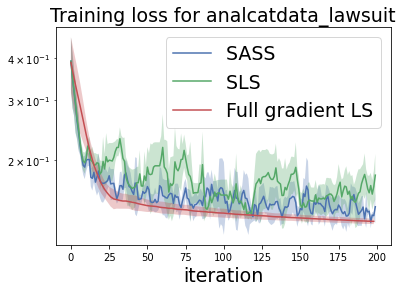

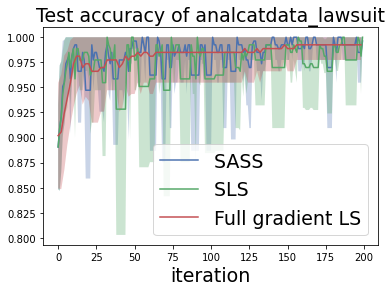

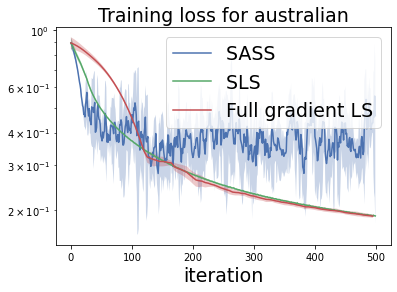

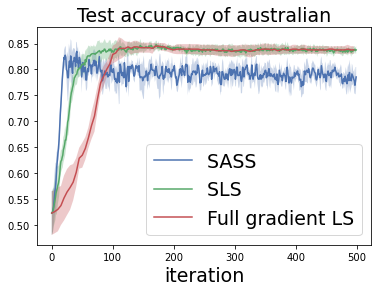

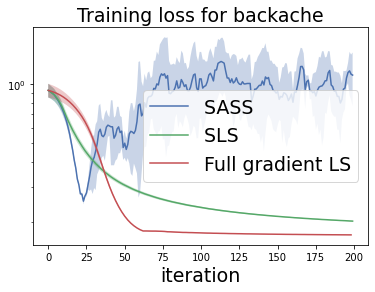

...

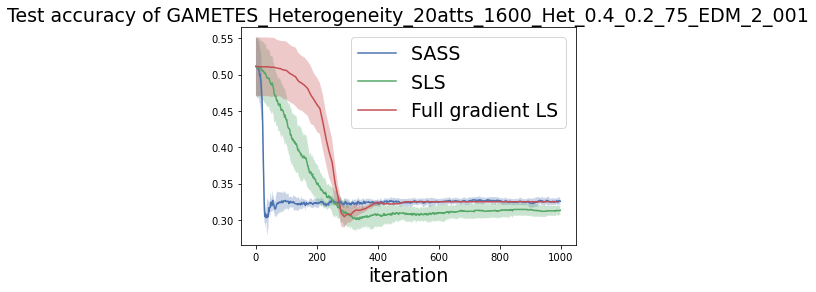

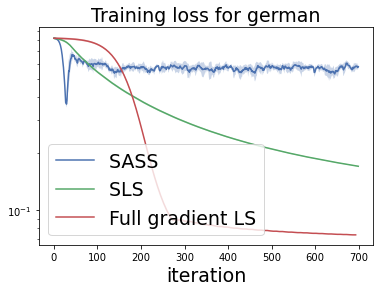

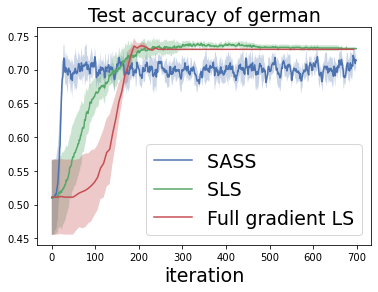

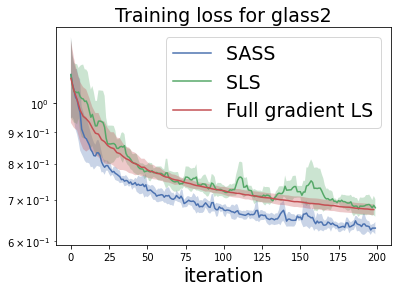

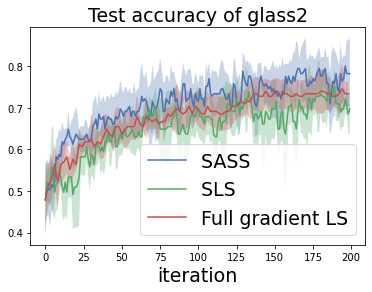

<ipython-input-11-9cbb0b732d5c>:43: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


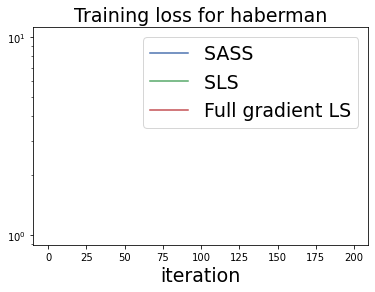

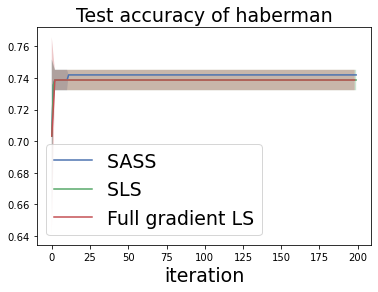

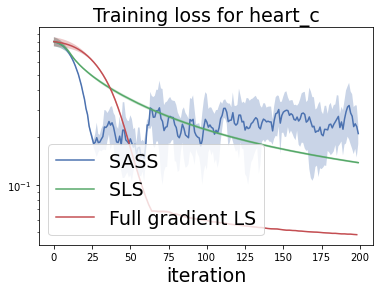

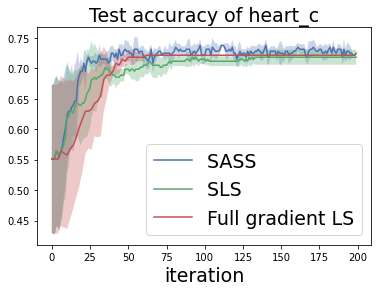

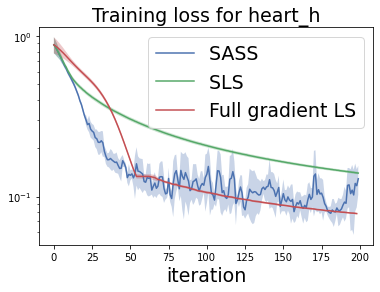

...

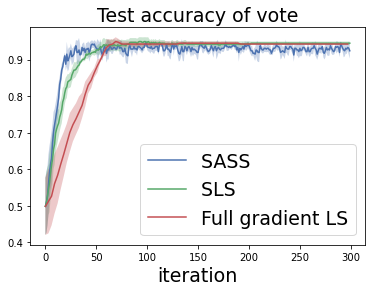

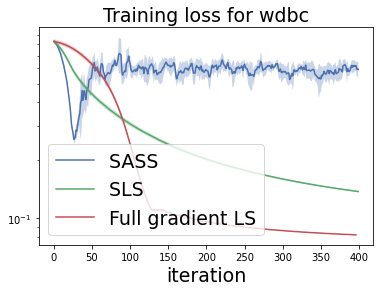

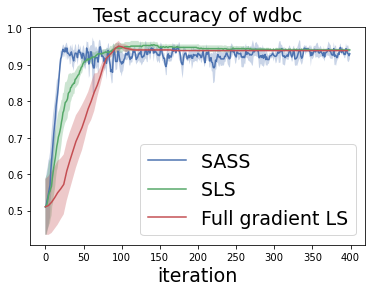

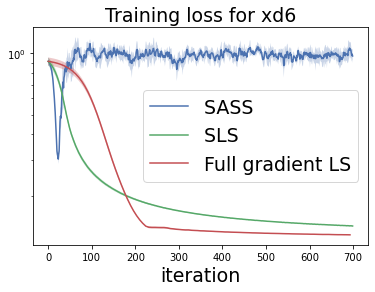

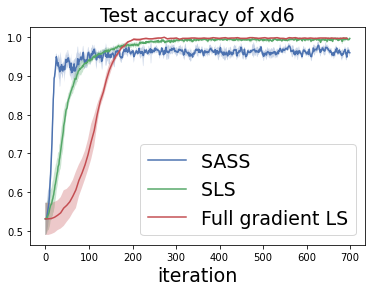

In [11]:
epoch = 100
for i in range(len(data_sets)):
    dataset = data_sets[i]
    result = results[i]
    fun_value_matrix1, fun_value_matrix_2, fun_value_matrix_full, \
    val_acc_matrix1, val_acc_matrix_2, val_acc_matrix_full, count_f_eval_extra_arr = result
    
    fun_value_means1 = fun_value_matrix1.mean(0)
    val_acc_means1 = val_acc_matrix1.mean(0)
    fun_value_means_2 = fun_value_matrix_2.mean(0)
    val_acc_means_2 = val_acc_matrix_2.mean(0)
    fun_value_means_full = fun_value_matrix_full.mean(0)
    val_acc_means_full = val_acc_matrix_full.mean(0)

    perform_our_algo_same_batch[i] = np.mean(fun_value_matrix1.min(axis=1))
    perform_sls[i] = np.mean(fun_value_matrix_2.min(axis=1))
    perform_full_grad[i] = np.mean(fun_value_matrix_full.min(axis=1))

    fun_value_std1 = np.std(fun_value_matrix1, axis=0)
    val_acc_std1 = np.std(val_acc_matrix1, axis=0)
    fun_value_std_2 = np.std(fun_value_matrix_2, axis=0)
    val_acc_std_2 = np.std(val_acc_matrix_2, axis=0)
    fun_value_std_full = np.std(fun_value_matrix_full, axis=0)
    val_acc_std_full = np.std(val_acc_matrix_full, axis=0)

    # plot the mean with standard deviation:
    iteration_num = np.arange(fun_value_means1.shape[0])
    num_of_batch = int(fun_value_means1.shape[0]/epoch)
    epoch_itr_num = num_of_batch*np.arange(epoch)
    fig, ax = plt.subplots()
    clrs = sns.color_palette("deep", 9)
    ax.plot(iteration_num, fun_value_means1, label="SASS ", c=clrs[0])
    ax.fill_between(iteration_num, fun_value_means1-fun_value_std1, fun_value_means1+fun_value_std1 ,alpha=0.3, facecolor=clrs[0])
    ax.plot(iteration_num, fun_value_means_2, label="SLS ", c=clrs[2])
    ax.fill_between(iteration_num, fun_value_means_2-fun_value_std_2, fun_value_means_2+fun_value_std_2 ,alpha=0.3, facecolor=clrs[2])
    ax.plot(epoch_itr_num, fun_value_means_full, label="Full gradient LS", c=clrs[3])
    ax.fill_between(epoch_itr_num, fun_value_means_full-fun_value_std_full, fun_value_means_full+fun_value_std_full ,alpha=0.3, facecolor=clrs[3])

    fontsize=19
    plt.title('Training loss for %s'%dataset, fontsize=fontsize)
    plt.xlabel('iteration',fontsize=fontsize)
    ax.legend(fontsize=fontsize)
    ax.set_yscale('log')
    plt.show()
    fig.savefig(dataset+'_full_compare_train.png', dpi=300)
    plt.close()

    # Plot validation accuracy
    fig, ax = plt.subplots()
    ax.plot(iteration_num, val_acc_means1, label="SASS ", c=clrs[0])
    ax.fill_between(iteration_num, np.maximum(val_acc_means1-val_acc_std1,0.0), np.minimum(val_acc_means1+val_acc_std1,1.0) ,alpha=0.3, facecolor=clrs[0])
    ax.plot(iteration_num, val_acc_means_2, label="SLS ", c=clrs[2])
    ax.fill_between(iteration_num, np.maximum(val_acc_means_2-val_acc_std_2,0.0), np.minimum(val_acc_means_2+val_acc_std_2, 1.0) ,alpha=0.3, facecolor=clrs[2])
    ax.plot(epoch_itr_num, val_acc_means_full, label="Full gradient LS", c=clrs[3])
    ax.fill_between(epoch_itr_num, np.maximum(val_acc_means_full-val_acc_std_full,0.0), np.minimum(val_acc_means_full+val_acc_std_full, 1.0) ,alpha=0.3, facecolor=clrs[3])

    ax.legend(fontsize=fontsize)
    plt.title('Test accuracy of %s'%dataset, fontsize=fontsize)
    plt.xlabel('iteration',fontsize=fontsize)

    plt.show()
    fig.savefig(dataset+'_full_compare_test.png', dpi=300)
    plt.close()


# Histograms of performance comparisons

array([ 4.24809175e-03,  2.25085595e-03, -5.23932033e-02, -3.29416586e-03,
       -1.10389625e-01,  3.63875986e-02,  2.43986997e-01,  2.02412371e-01,
       -1.87341190e-01,  1.74052327e-02,  8.86557450e-02,  4.38771263e-02,
        1.34696741e-01,  8.25144735e-02, -1.52070493e-01,  1.58559428e-02,
       -2.06483467e-01, -2.22763965e-01, -1.43572673e-01,  1.33304559e+00,
        1.60624907e-02,  6.29812820e-03,  1.37308157e-01,  1.33743854e-01,
        1.19299839e-01,  1.27633686e-01,  1.33268979e-01,  1.32119707e-01,
       -1.88549988e-01,  4.34607589e-02,  4.37293312e-01,  4.73127608e-02,
        7.79349960e-02,  5.95740860e-02,  2.92371935e+00,  4.81819357e-03,
        8.92688258e-03,  8.84329733e-01,  3.94109657e-02,  6.96904458e-02,
        9.17969902e-03,  2.71416672e-02,  7.72565142e-03,  7.71546055e-02,
       -1.08462804e-01,  1.78211931e-02,  3.83515023e-02,  1.47812878e-02,
       -3.26291901e-01,  1.26611500e-03,  2.79855660e-02,  1.72713967e-02,
        2.53727108e-02,  

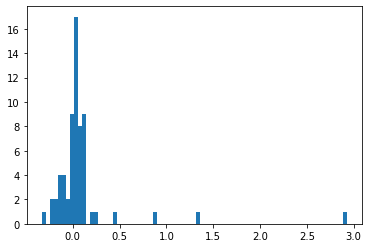

In [12]:
plt.hist(perform_sls-perform_our_algo_same_batch, bins='auto') 
# plt.title("Histogram of perform_sls-perform_our_algo_same_batch")
plt.savefig('Histogram of perform_sls-perform_our_algo_same_batch.png')
np.mean(perform_sls-perform_our_algo_same_batch)
perform_sls-perform_our_algo_same_batch

array([ 5.33702844e-03,  2.03328801e-03, -8.22917320e-02,  4.01111422e-02,
       -1.65927885e-01,  3.84034408e-02,  1.94014662e-01,  1.65632392e-01,
       -2.34567905e-01,  4.98756464e-02, -9.88090756e-04, -4.30015335e-02,
       -3.38140393e-10, -1.65223178e-02, -2.11442827e-01,  0.00000000e+00,
       -2.60424964e-01, -3.18226454e-01, -1.46508209e-01,  1.64567607e+00,
        1.48992947e-01,  8.00071033e-02, -2.09260017e-03, -5.46658086e-03,
       -1.01289056e-02, -3.34879536e-03, -4.93140893e-03, -4.43069926e-03,
       -2.85772192e-01,  5.15515365e-02,  6.58534786e-01, -4.26108167e-02,
        1.62280045e-02, -1.02103322e-02,  6.16928730e-12,  1.08462383e+00,
        2.38518289e-01,  3.00519502e-01,  1.76667233e-02, -9.44417190e-04,
        1.55291668e-01,  5.53397558e-02,  3.23467988e-02, -8.37740174e-04,
       -1.32376466e-01,  1.31790175e-01,  1.15125319e-01,  4.26448823e-02,
       -4.15222201e-01,  1.45086064e-01,  3.06645213e-02,  1.47041009e-02,
        1.60936553e-01,  

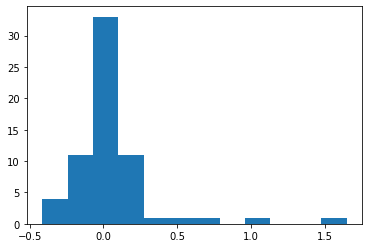

In [13]:
plt.hist(perform_full_grad-perform_our_algo_same_batch, bins=12) 
# plt.title("perform_full_grad-perform_our_algo_same_batch")
plt.savefig('Histogram of perform_full_grad-perform_our_algo_same_batch.png')
perform_full_grad-perform_our_algo_same_batch

# Compare choices for epsilon_f

In [14]:
%%time
import ray
import time

# Start Ray.
ray.shutdown()
ray.init()

sample_size= 128 # try different values
data_sets = dataset_names_new
number_datasets=len(data_sets)

perform_our_algo_same_batch= np.zeros(number_datasets)
perform_sls= np.zeros(number_datasets)
perform_full_grad= np.zeros(number_datasets)

@ray.remote
def parallel_wrapper(dataset):
    np.random.seed(1)
    
    sigma_para=1
    X_train,Y_train,X_test,Y_test=get_dataset(dataset, sigma_para, sample_size)

    #run the algorithm with multiple initial points and check performance

    n = len(X_train)
    num_of_batch =n/sample_size
    print("DATASET: ", dataset)
    print("number of 128 samples: ",num_of_batch)
    dim=len(X_train[0])

    trials=5
    epoch=100
    iteration=int(epoch*num_of_batch)
    fun_value_matrix=np.zeros([trials,iteration])
    fun_value_matrix1=np.zeros([trials,iteration])
    fun_value_matrix2=np.zeros([trials,iteration])
    fun_value_matrix3=np.zeros([trials,iteration])
    fun_value_matrix4=np.zeros([trials,iteration])
    fun_value_matrix_2=np.zeros([trials,iteration])

    val_acc_matrix=np.zeros([trials,iteration])
    val_acc_matrix1=np.zeros([trials,iteration])
    val_acc_matrix2=np.zeros([trials,iteration])
    val_acc_matrix3=np.zeros([trials,iteration])
    val_acc_matrix4=np.zeros([trials,iteration])
    val_acc_matrix_2=np.zeros([trials,iteration])


    for k in range(0,trials):
        #parameters for line search
        X_train,Y_train= shuffle(X_train, Y_train, random_state=k)
        x_0=np.random.normal(0, 1, dim)
        dec_gamma=0.7
        inc_gamma=1.25
        theta=0.2
        alpha_max=np.inf
        alpha_0=1
        n_trials=30
        ### use the standard deviation of noisy function values at x_0 as epi_f ###
        eps_f = estimate_epi_f(f,X_train,Y_train,x_0,zeroth_oracle,sample_size,n_trials) 

        x_output,fun_value_arr,val_acc_arr=line_search_same_batch(f,grad_f,X_train,Y_train,zeroth_oracle_epoch,
                                                      first_oracle_epoch,sample_size,x_0,
                                                      eps_f,alpha_0,alpha_max,dec_gamma,inc_gamma,
                                                      theta,epoch,factor=1/5,epi_f_zeroth_oracle=zeroth_oracle,
                                                      x_test=X_test,y_test=Y_test)
        fun_value_matrix[k,:] = fun_value_arr
        val_acc_matrix[k,:] = val_acc_arr

        x_output1,fun_value_arr1,val_acc_arr1=line_search_same_batch(f,grad_f,X_train,Y_train,zeroth_oracle_epoch,
                                                      first_oracle_epoch,sample_size,x_0,
                                                      eps_f,alpha_0,alpha_max,dec_gamma,inc_gamma,
                                                      theta,epoch,factor=1,epi_f_zeroth_oracle=zeroth_oracle,
                                                      x_test=X_test,y_test=Y_test)
        fun_value_matrix1[k,:] = fun_value_arr1
        val_acc_matrix1[k,:] = val_acc_arr1

        x_output2,fun_value_arr2,val_acc_arr2=line_search_same_batch(f,grad_f,X_train,Y_train,zeroth_oracle_epoch,
                                                      first_oracle_epoch,sample_size,x_0,
                                                      eps_f,alpha_0,alpha_max,dec_gamma,inc_gamma,
                                                      theta,epoch,factor=1/2,epi_f_zeroth_oracle=zeroth_oracle,
                                                      x_test=X_test,y_test=Y_test)
        fun_value_matrix2[k,:] = fun_value_arr2
        val_acc_matrix2[k,:] = val_acc_arr2

        x_output4,fun_value_arr4,val_acc_arr4=line_search_same_batch(f,grad_f,X_train,Y_train,zeroth_oracle_epoch,
                                                      first_oracle_epoch,sample_size,x_0,
                                                      eps_f,alpha_0,alpha_max,dec_gamma,inc_gamma,
                                                      theta,epoch,factor=0,epi_f_zeroth_oracle=zeroth_oracle,
                                                      x_test=X_test,y_test=Y_test)
        fun_value_matrix4[k,:] = fun_value_arr4
        val_acc_matrix4[k,:] = val_acc_arr4

        c=0.1
        beta=0.9
        gamma=1.5
        eta_max=1

    return fun_value_matrix, fun_value_matrix1, fun_value_matrix2, fun_value_matrix3, fun_value_matrix4, fun_value_matrix_2, \
           val_acc_matrix, val_acc_matrix1, val_acc_matrix2, val_acc_matrix3, val_acc_matrix4, val_acc_matrix_2  


datasets_test = data_sets
result_ids = []

for dataset in datasets_test:
    result_ids.append(parallel_wrapper.remote(dataset))


results = ray.get(result_ids)  
ray.shutdown()

2022-07-02 15:25:01,924	INFO services.py:1267 -- View the Ray dashboard at http://127.0.0.1:8265


(pid=10140) DATASET:  breast
(pid=10140) number of 128 samples:  5.0
(pid=10140) DATASET:  breast
(pid=10140) number of 128 samples:  5.0
(pid=10145) DATASET:  analcatdata_lawsuit
(pid=10145) number of 128 samples:  2.0
(pid=10145) DATASET:  analcatdata_lawsuit
(pid=10145) number of 128 samples:  2.0
(pid=10144) DATASET:  breast_w
(pid=10144) number of 128 samples:  5.0
(pid=10144) DATASET:  breast_w
(pid=10144) number of 128 samples:  5.0
(pid=10141) DATASET:  breast_cancer
(pid=10141) number of 128 samples:  2.0
(pid=10141) DATASET:  breast_cancer
(pid=10141) number of 128 samples:  2.0
(pid=10146) DATASET:  biomed
(pid=10146) number of 128 samples:  2.0
(pid=10146) DATASET:  biomed
(pid=10146) number of 128 samples:  2.0
(pid=10143) DATASET:  australian
(pid=10143) number of 128 samples:  5.0
(pid=10143) DATASET:  australian
(pid=10143) number of 128 samples:  5.0
(pid=10147) DATASET:  backache
(pid=10147) number of 128 samples:  2.0
(pid=10147) DATASET:  backache
(pid=10147) number

(pid=10143) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10143) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp


(pid=10146) DATASET:  buggyCrx
(pid=10146) number of 128 samples:  5.0
(pid=10146) DATASET:  buggyCrx
(pid=10146) number of 128 samples:  5.0
(pid=10145) DATASET:  bupa
(pid=10145) number of 128 samples:  3.0
(pid=10145) DATASET:  bupa
(pid=10145) number of 128 samples:  3.0
(pid=10147) DATASET:  chess
(pid=10147) number of 128 samples:  20.0
(pid=10147) DATASET:  chess
(pid=10147) number of 128 samples:  20.0
(pid=10141) DATASET:  churn
(pid=10141) number of 128 samples:  32.0
(pid=10141) DATASET:  churn
(pid=10141) number of 128 samples:  32.0


(pid=10147) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10147) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp


(pid=10142) DATASET:  clean1
(pid=10142) number of 128 samples:  3.0
(pid=10142) DATASET:  clean1
(pid=10142) number of 128 samples:  3.0
(pid=10143) DATASET:  cleve
(pid=10143) number of 128 samples:  2.0
(pid=10143) DATASET:  cleve
(pid=10143) number of 128 samples:  2.0
(pid=10140) DATASET:  colic
(pid=10140) number of 128 samples:  3.0
(pid=10140) DATASET:  colic
(pid=10140) number of 128 samples:  3.0
(pid=10144) DATASET:  corral
(pid=10144) number of 128 samples:  1.0
(pid=10144) DATASET:  corral
(pid=10144) number of 128 samples:  1.0


(pid=10147) <ipython-input-3-7719a92b7659>:13: RuntimeWarning: overflow encountered in exp
(pid=10147) <ipython-input-3-7719a92b7659>:13: RuntimeWarning: overflow encountered in exp


(pid=10145) DATASET:  credit_a
(pid=10145) number of 128 samples:  5.0
(pid=10145) DATASET:  credit_a
(pid=10145) number of 128 samples:  5.0
(pid=10142) DATASET:  credit_g
(pid=10142) number of 128 samples:  7.0
(pid=10142) DATASET:  credit_g
(pid=10142) number of 128 samples:  7.0
(pid=10144) DATASET:  crx
(pid=10144) number of 128 samples:  5.0
(pid=10144) DATASET:  crx
(pid=10144) number of 128 samples:  5.0


(pid=10144) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10144) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp


(pid=10146) DATASET:  diabetes
(pid=10146) number of 128 samples:  5.0
(pid=10146) DATASET:  diabetes
(pid=10146) number of 128 samples:  5.0
(pid=10143) DATASET:  dis
(pid=10143) number of 128 samples:  24.0
(pid=10143) DATASET:  dis
(pid=10143) number of 128 samples:  24.0
(pid=10140) DATASET:  flare
(pid=10140) number of 128 samples:  7.0
(pid=10140) DATASET:  flare
(pid=10140) number of 128 samples:  7.0
(pid=10145) DATASET:  GAMETES_Epistasis_2_Way_1000atts_0.4H_EDM_1_EDM_1_1
(pid=10145) number of 128 samples:  10.0
(pid=10145) DATASET:  GAMETES_Epistasis_2_Way_1000atts_0.4H_EDM_1_EDM_1_1
(pid=10145) number of 128 samples:  10.0


(pid=10145) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10145) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp


(pid=10144) DATASET:  GAMETES_Epistasis_2_Way_20atts_0.1H_EDM_1_1
(pid=10144) number of 128 samples:  10.0
(pid=10144) DATASET:  GAMETES_Epistasis_2_Way_20atts_0.1H_EDM_1_1
(pid=10144) number of 128 samples:  10.0
(pid=10146) DATASET:  GAMETES_Epistasis_2_Way_20atts_0.4H_EDM_1_1
(pid=10146) number of 128 samples:  10.0
(pid=10146) DATASET:  GAMETES_Epistasis_2_Way_20atts_0.4H_EDM_1_1
(pid=10146) number of 128 samples:  10.0


(pid=10146) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10146) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10144) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10144) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10143) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10143) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10144) <ipython-input-3-7719a92b7659>:13: RuntimeWarning: overflow encountered in exp
(pid=10144) <ipython-input-3-7719a92b7659>:13: RuntimeWarning: overflow encountered in exp
(pid=10146) <ipython-input-3-7719a92b7659>:13: RuntimeWarning: overflow encountered in exp
(pid=10146) <ipython-input-3-7719a92b7659>:13: RuntimeWarning: overflow encountered in exp


(pid=10142) DATASET:  GAMETES_Epistasis_3_Way_20atts_0.2H_EDM_1_1
(pid=10142) number of 128 samples:  10.0
(pid=10142) DATASET:  GAMETES_Epistasis_3_Way_20atts_0.2H_EDM_1_1
(pid=10142) number of 128 samples:  10.0


(pid=10142) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10142) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10142) <ipython-input-3-7719a92b7659>:13: RuntimeWarning: overflow encountered in exp
(pid=10142) <ipython-input-3-7719a92b7659>:13: RuntimeWarning: overflow encountered in exp


(pid=10140) DATASET:  GAMETES_Heterogeneity_20atts_1600_Het_0.4_0.2_50_EDM_2_001
(pid=10140) number of 128 samples:  10.0
(pid=10140) DATASET:  GAMETES_Heterogeneity_20atts_1600_Het_0.4_0.2_50_EDM_2_001
(pid=10140) number of 128 samples:  10.0


(pid=10140) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10140) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10140) <ipython-input-3-7719a92b7659>:13: RuntimeWarning: overflow encountered in exp
(pid=10140) <ipython-input-3-7719a92b7659>:13: RuntimeWarning: overflow encountered in exp


(pid=10145) DATASET:  GAMETES_Heterogeneity_20atts_1600_Het_0.4_0.2_75_EDM_2_001
(pid=10145) number of 128 samples:  10.0
(pid=10145) DATASET:  GAMETES_Heterogeneity_20atts_1600_Het_0.4_0.2_75_EDM_2_001
(pid=10145) number of 128 samples:  10.0


(pid=10145) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10145) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp


(pid=10146) DATASET:  german
(pid=10146) number of 128 samples:  7.0
(pid=10146) DATASET:  german
(pid=10146) number of 128 samples:  7.0
(pid=10144) DATASET:  glass2
(pid=10144) number of 128 samples:  2.0
(pid=10144) DATASET:  glass2
(pid=10144) number of 128 samples:  2.0
(pid=10142) DATASET:  haberman
(pid=10142) number of 128 samples:  2.0
(pid=10142) DATASET:  haberman
(pid=10142) number of 128 samples:  2.0


(pid=10141) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10141) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10145) <ipython-input-3-7719a92b7659>:13: RuntimeWarning: overflow encountered in exp
(pid=10145) <ipython-input-3-7719a92b7659>:13: RuntimeWarning: overflow encountered in exp


(pid=10144) DATASET:  heart_c
(pid=10144) number of 128 samples:  2.0
(pid=10144) DATASET:  heart_c
(pid=10144) number of 128 samples:  2.0
(pid=10140) DATASET:  heart_h
(pid=10140) number of 128 samples:  2.0
(pid=10140) DATASET:  heart_h
(pid=10140) number of 128 samples:  2.0
(pid=10142) DATASET:  heart_statlog
(pid=10142) number of 128 samples:  2.0
(pid=10142) DATASET:  heart_statlog
(pid=10142) number of 128 samples:  2.0
(pid=10144) DATASET:  hepatitis
(pid=10144) number of 128 samples:  1.0
(pid=10144) DATASET:  hepatitis
(pid=10144) number of 128 samples:  1.0
(pid=10140) DATASET:  Hill_Valley_with_noise
(pid=10140) number of 128 samples:  8.0
(pid=10140) DATASET:  Hill_Valley_with_noise
(pid=10140) number of 128 samples:  8.0
(pid=10146) DATASET:  Hill_Valley_without_noise
(pid=10146) number of 128 samples:  8.0
(pid=10146) DATASET:  Hill_Valley_without_noise
(pid=10146) number of 128 samples:  8.0
(pid=10142) DATASET:  horse_colic
(pid=10142) number of 128 samples:  3.0
(pid

(pid=10147) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10147) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp


(pid=10140) DATASET:  mofn_3_7_10
(pid=10140) number of 128 samples:  9.0
(pid=10140) DATASET:  mofn_3_7_10
(pid=10140) number of 128 samples:  9.0
(pid=10144) DATASET:  monk1
(pid=10144) number of 128 samples:  4.0
(pid=10144) DATASET:  monk1
(pid=10144) number of 128 samples:  4.0
(pid=10146) DATASET:  monk2
(pid=10146) number of 128 samples:  4.0
(pid=10146) DATASET:  monk2
(pid=10146) number of 128 samples:  4.0
(pid=10145) DATASET:  monk3
(pid=10145) number of 128 samples:  4.0
(pid=10145) DATASET:  monk3
(pid=10145) number of 128 samples:  4.0


(pid=10147) <ipython-input-3-7719a92b7659>:13: RuntimeWarning: overflow encountered in exp
(pid=10147) <ipython-input-3-7719a92b7659>:13: RuntimeWarning: overflow encountered in exp


(pid=10144) DATASET:  parity5+5
(pid=10144) number of 128 samples:  8.0
(pid=10144) DATASET:  parity5+5
(pid=10144) number of 128 samples:  8.0
(pid=10146) DATASET:  pima
(pid=10146) number of 128 samples:  5.0
(pid=10146) DATASET:  pima
(pid=10146) number of 128 samples:  5.0


(pid=10142) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10142) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp


(pid=10145) DATASET:  prnn_crabs
(pid=10145) number of 128 samples:  2.0
(pid=10145) DATASET:  prnn_crabs
(pid=10145) number of 128 samples:  2.0
(pid=10145) DATASET:  prnn_synth
(pid=10145) number of 128 samples:  2.0
(pid=10145) DATASET:  prnn_synth
(pid=10145) number of 128 samples:  2.0
(pid=10140) DATASET:  profb
(pid=10140) number of 128 samples:  5.0
(pid=10140) DATASET:  profb
(pid=10140) number of 128 samples:  5.0
(pid=10146) DATASET:  saheart
(pid=10146) number of 128 samples:  3.0
(pid=10146) DATASET:  saheart
(pid=10146) number of 128 samples:  3.0
(pid=10145) DATASET:  sonar
(pid=10145) number of 128 samples:  2.0
(pid=10145) DATASET:  sonar
(pid=10145) number of 128 samples:  2.0
(pid=10144) DATASET:  spambase
(pid=10144) number of 128 samples:  29.0
(pid=10144) DATASET:  spambase
(pid=10144) number of 128 samples:  29.0
(pid=10146) DATASET:  spect
(pid=10146) number of 128 samples:  2.0
(pid=10146) DATASET:  spect
(pid=10146) number of 128 samples:  2.0
(pid=10140) DATA

(pid=10146) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10146) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10144) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp
(pid=10144) <ipython-input-3-7719a92b7659>:4: RuntimeWarning: overflow encountered in exp


(pid=10140) DATASET:  tokyo1
(pid=10140) number of 128 samples:  6.0
(pid=10140) DATASET:  tokyo1
(pid=10140) number of 128 samples:  6.0
(pid=10145) DATASET:  vote
(pid=10145) number of 128 samples:  3.0
(pid=10145) DATASET:  vote
(pid=10145) number of 128 samples:  3.0
(pid=10143) DATASET:  wdbc
(pid=10143) number of 128 samples:  4.0
(pid=10143) DATASET:  wdbc
(pid=10143) number of 128 samples:  4.0
(pid=10145) DATASET:  xd6
(pid=10145) number of 128 samples:  7.0
(pid=10145) DATASET:  xd6
(pid=10145) number of 128 samples:  7.0
CPU times: user 1min 32s, sys: 25.7 s, total: 1min 58s
Wall time: 1h 10min 46s


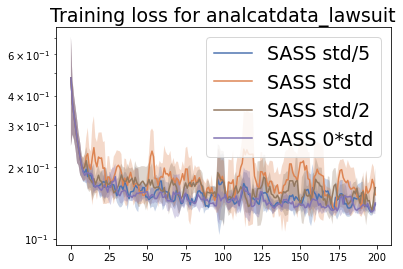

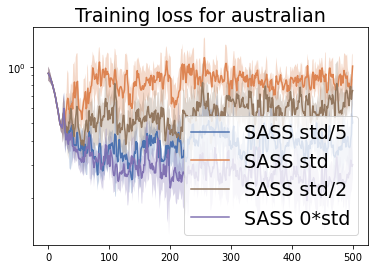

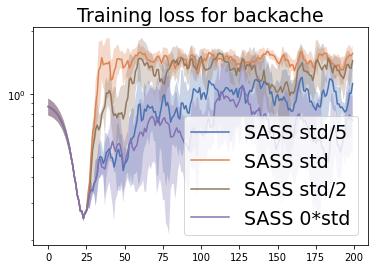

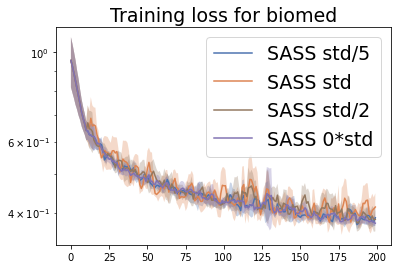

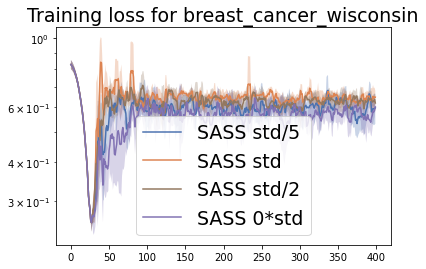

...

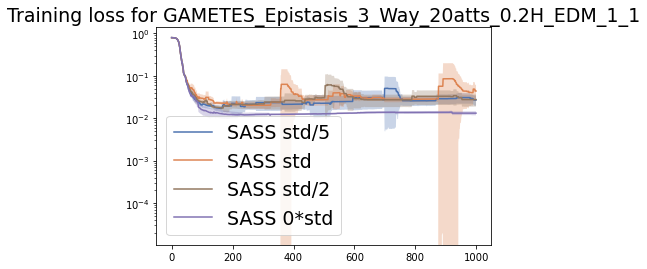

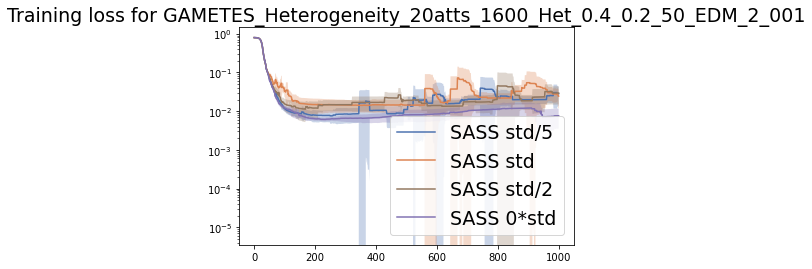

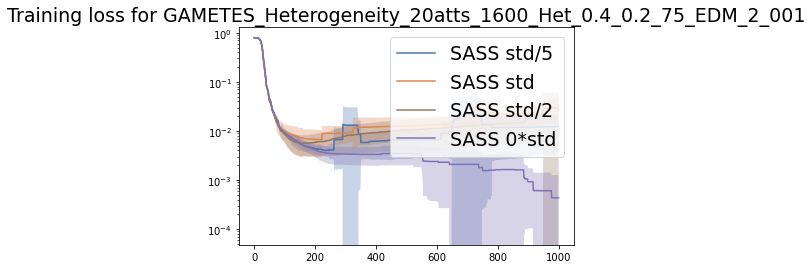

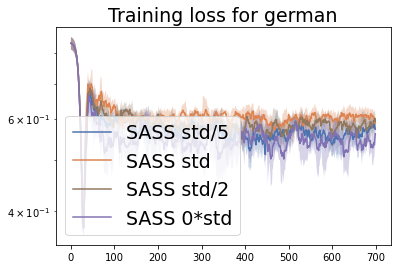

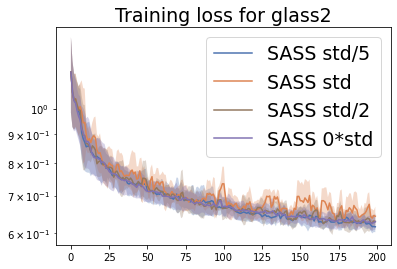

<ipython-input-15-ac9b0ff94d2a>:52: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


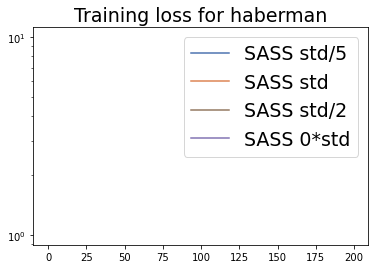

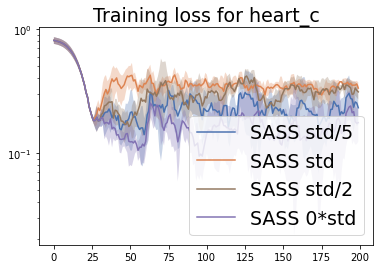

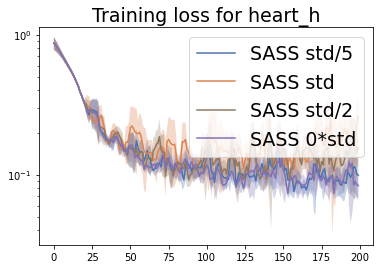

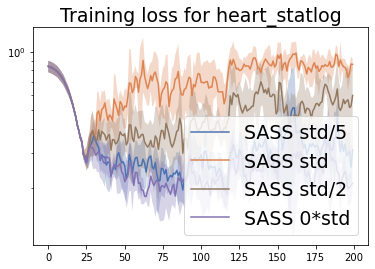

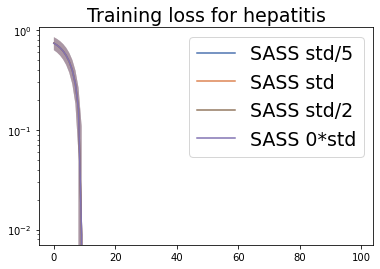

...

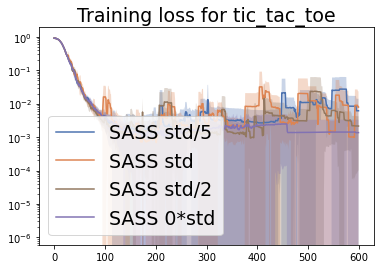

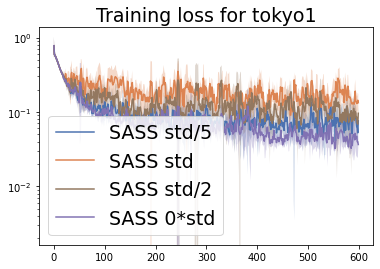

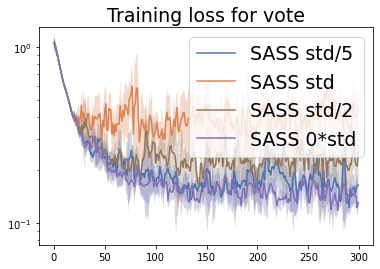

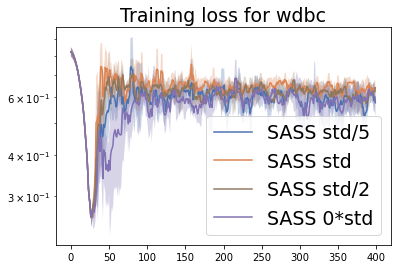

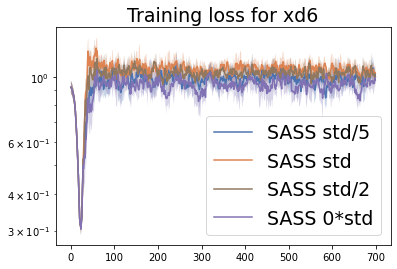

In [15]:
for i in range(len(datasets_test)):
    dataset = datasets_test[i]
    result = results[i]
    fun_value_matrix, fun_value_matrix1, fun_value_matrix2, fun_value_matrix3, fun_value_matrix4, fun_value_matrix_2, \
    val_acc_matrix, val_acc_matrix1, val_acc_matrix2, val_acc_matrix3, val_acc_matrix4, val_acc_matrix_2 = result
    

    fun_value_means = fun_value_matrix.mean(0)
    val_acc_means = val_acc_matrix.mean(0)
    fun_value_means1 = fun_value_matrix1.mean(0)
    val_acc_means1 = val_acc_matrix1.mean(0)
    fun_value_means2 = fun_value_matrix2.mean(0)
    val_acc_means2 = val_acc_matrix2.mean(0)
    fun_value_means3 = fun_value_matrix3.mean(0)
    val_acc_means3 = val_acc_matrix3.mean(0)
    fun_value_means4 = fun_value_matrix4.mean(0)
    val_acc_means4 = val_acc_matrix4.mean(0)
    fun_value_means_2 = fun_value_matrix_2.mean(0)
    val_acc_means_2 = val_acc_matrix_2.mean(0)


    fun_value_std = np.std(fun_value_matrix, axis=0)
    val_acc_std = np.std(val_acc_matrix, axis=0)
    fun_value_std1 = np.std(fun_value_matrix1, axis=0)
    val_acc_std1 = np.std(val_acc_matrix1, axis=0)
    fun_value_std2 = np.std(fun_value_matrix2, axis=0)
    val_acc_std2 = np.std(val_acc_matrix2, axis=0)
    fun_value_std3 = np.std(fun_value_matrix3, axis=0)
    val_acc_std3 = np.std(val_acc_matrix3, axis=0)
    fun_value_std4 = np.std(fun_value_matrix4, axis=0)
    val_acc_std4 = np.std(val_acc_matrix4, axis=0)
    fun_value_std_2 = np.std(fun_value_matrix_2, axis=0)
    val_acc_std_2 = np.std(val_acc_matrix_2, axis=0)

    # plot the mean with standard deviation:
    iteration_num = np.arange(fun_value_means1.shape[0])

    fig, ax = plt.subplots()
    clrs = sns.color_palette("deep", 9)
    ax.plot(iteration_num, fun_value_means, label="SASS std/5", c=clrs[0])
    ax.fill_between(iteration_num, fun_value_means-fun_value_std, fun_value_means+fun_value_std ,alpha=0.3, facecolor=clrs[0])
    ax.plot(iteration_num, fun_value_means1, label="SASS std", c=clrs[1])
    ax.fill_between(iteration_num, fun_value_means1-fun_value_std1, fun_value_means1+fun_value_std1 ,alpha=0.3, facecolor=clrs[1])   
    ax.plot(iteration_num, fun_value_means2, label="SASS std/2", c=clrs[5])
    ax.fill_between(iteration_num, fun_value_means2-fun_value_std2, fun_value_means2+fun_value_std2 ,alpha=0.3, facecolor=clrs[5])
    ax.plot(iteration_num, fun_value_means4, label="SASS 0*std", c=clrs[4])
    ax.fill_between(iteration_num, fun_value_means4-fun_value_std4, fun_value_means4+fun_value_std4 ,alpha=0.3, facecolor=clrs[4])

    size = 19
    plt.title('Training loss for %s'%dataset, fontsize=size)
    ax.legend(fontsize=size)
    ax.set_yscale('log')
    plt.show()
    fig.savefig(dataset+'_compare_epi_f_%d.png'%size, dpi=300)
    plt.close()
